In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from astropy.time import Time
import pandas as pd
import FATS
import sys
from scipy.stats import anderson_ksamp

%matplotlib inline
plt.rcParams['figure.figsize'] = (9, 6)
sns.set(style="whitegrid", color_codes=True, context="poster")

/Users/jorgetil/miniconda/lib/python2.7/site-packages/matplotlib/__init__.py:872: UserWarning: axes.color_cycle is deprecated and replaced with axes.prop_cycle; please use the latter.
  warnings.warn(self.msg_depr % (key, alt_key))
/Users/jorgetil/miniconda/lib/python2.7/site-packages/IPython/kernel/__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated. You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)


In [2]:
#Random walk
def random_walk(n_sample=1, time=None, N=2000,
               alpha=1, sigma=.01):
    rw_lcs = []
    rw_err = []
    n = 0
    while n < n_sample:
        print '\r', n,
        sys.stdout.flush()
        mag_rw = np.zeros(N)
        mag_rw[0] = np.random.uniform(15,25)

        time_rw = xrange(1, N)

        for t in time_rw:
            mag_rw[t] = alpha * mag_rw[t-1] + np.random.normal(loc=.0,
                                                               scale=sigma)

        mag_rw = mag_rw.squeeze()
        rw_lcs.append(mag_rw)
        err_rw = mag_rw*np.random.gamma(3,.3,N)/1000
        rw_err.append(err_rw)
        n += 1
    print 'Done!'
    return np.array(rw_lcs), np.array(rw_err)

In [3]:
#Normal
def random_normal(n_sample=1, time=None, N=2000, sigma=.05):
    normal_lcs = []
    normal_err = []
    n = 0
    while n < n_sample:
        print '\r', n,
        sys.stdout.flush()
        mag_normal = np.random.normal(loc=np.random.uniform(15,25),
                                  scale=sigma, size=N)
        err_normal = mag_normal*np.random.gamma(3,.3,N)/1000
        normal_lcs.append(mag_normal)
        normal_err.append(err_normal)
        n += 1
    print 'Done!'
    return np.array(normal_lcs), np.array(normal_err)

In [4]:
# Sawtooth 
def sawtooth_signal(n_sample=1, time=np.arange(2000), A=[.5], P=[10]):
    N = time.shape[0]
    sawtooth_lcs = []
    sawtooth_err = []
    n = 0
    while n < n_sample:
        print '\r', n,
        sys.stdout.flush()
        #mag_sawtooth = np.random.uniform(15,25) + (2*A)/(np.pi) * \
        #        np.arctan(1/(np.tan(time*np.pi/P))) * (A/2)*np.sin(2*np.pi*time/P)\
        #    + np.random.normal(loc=0,scale=0.05, size=N)
        mag_sawtooth = np.random.uniform(15,25) + (A[n])*np.sin(2*np.pi*time/P[n])\
                    + np.random.normal(loc=0,scale=0.05, size=N)
        err_sawtooth = mag_sawtooth*np.random.gamma(3,.3,N)/1000
        sawtooth_lcs.append(mag_sawtooth)
        sawtooth_err.append(err_sawtooth)
        n += 1
    print 'Done!'
    return np.array(sawtooth_lcs), np.array(sawtooth_err)

In [5]:
def HiTS_sample_func(time, mags_shape=1, cadence=0.067, n_points=35,
                     obs_per_night=5, delta=.002, plot=False):
    obs_idx = np.zeros(n_points, dtype='int')
    start_idx = np.random.randint(0, len(time)/10, size=mags_shape)[0]
    obs_idx[0] = start_idx
    start_time = time[start_idx]
    observs = 0
    while observs < n_points:
        if observs%obs_per_night != 0:
            next_time = start_time + cadence + np.random.normal(0, 0.003)
        else:
            next_time = start_time + .5 + np.random.normal(0, 0.003)
        idx = np.where((time > next_time - delta/2) & 
                       (time < next_time + delta/2))[0][0]
        obs_idx[observs] = idx
        start_time = time[idx]
        observs += 1
    if plot:
        plt.plot(time[obs_idx], '.')
        plt.show()
    return obs_idx

In [141]:
def MACHO_sample_func(time, cadence=2.4, n_points=500,
                     delta=.002, plot=False):
    obs_idx = []
    start_idx = np.random.randint(0, 100, size=1)[0]
    obs_idx.append(start_idx)
    start_time = time[start_idx]
    observs = 0
    while observs < n_points:
        #next_time = start_time + np.random.gamma(shape=3.1, scale=1.5)
        if np.random.normal(loc=0, scale=0.3) > .65:
            next_time = start_time + np.random.uniform(15,200)
        else:
            next_time = start_time + np.random.noncentral_chisquare(df=.2, nonc=4.5)
        if next_time >= np.max(time): 
            break
        idx = np.where((time > next_time - delta/2) & 
                       (time < next_time + delta/2))[0][0]
        obs_idx.append(idx)
        start_time = time[idx]
        observs += 1
    if plot:
        plt.plot(time[obs_idx], '.')
        plt.show()
    return obs_idx

In [7]:
mjd = pd.date_range('1/1/2010','31/12/2016', freq='162S').to_julian_date().values - 2400000.5
print mjd.shape
delta_t = mjd[1] - mjd[0]
print 'delta t = %f days' % delta_t
print 'time coverage = %f days' % (mjd[-1] - mjd[0])

(1363201,)
delta t = 0.001875 days
time coverage = 2556.000000 days


In [8]:
walk_mag, walk_err = random_walk(n_sample=100, N=mjd.shape[0], sigma=.001)
print walk_mag.shape

99 Done!
(100, 1363201)


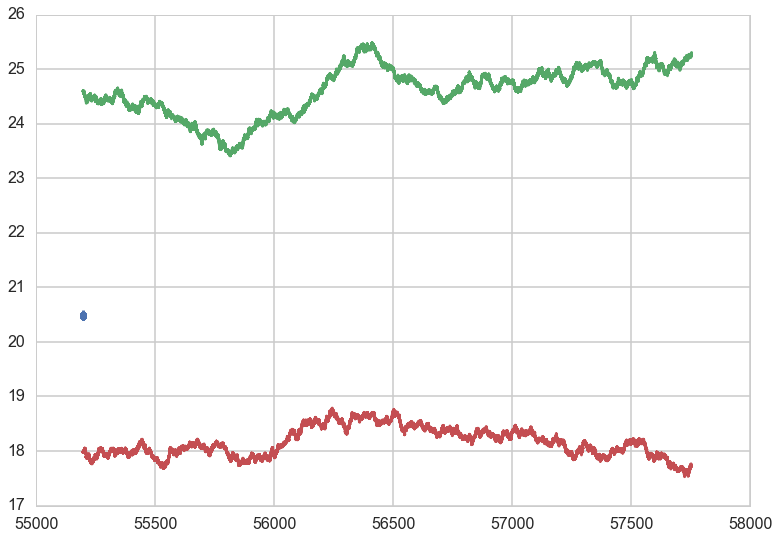

In [9]:
plt.errorbar(mjd[:1000], walk_mag[0,:1000], yerr=walk_err[0,:1000], fmt='b.')
plt.plot(mjd, walk_mag[1,:], 'r')
plt.plot(mjd, walk_mag[9,:], 'g')
plt.show()

In [10]:
normal_mag, normal_err = random_normal(n_sample=100, N=mjd.shape[0], sigma=.05)
print normal_mag.shape

99 Done!
(100, 1363201)


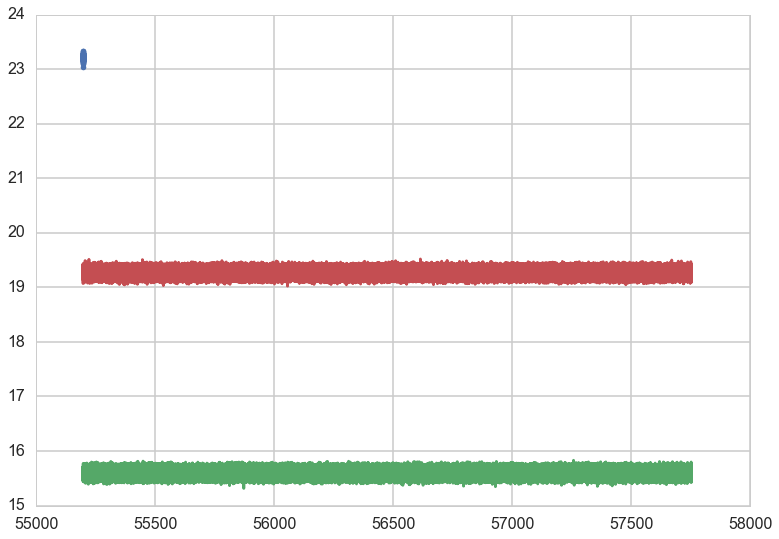

In [11]:
plt.errorbar(mjd[:100], normal_mag[0,:100], yerr=normal_err[0,:100], fmt='b.')
plt.plot(mjd, normal_mag[3], 'r')
plt.plot(mjd, normal_mag[28], 'g')
plt.show()

In [12]:
nn = 100
P = np.random.uniform(0.05,10, size=nn)
A = np.random.uniform(0.01,2.5, size=nn)
periodic_mag, periodic_err = sawtooth_signal(n_sample=nn, time=mjd, P=P, A=A)
print periodic_mag.shape

99 Done!
(100, 1363201)


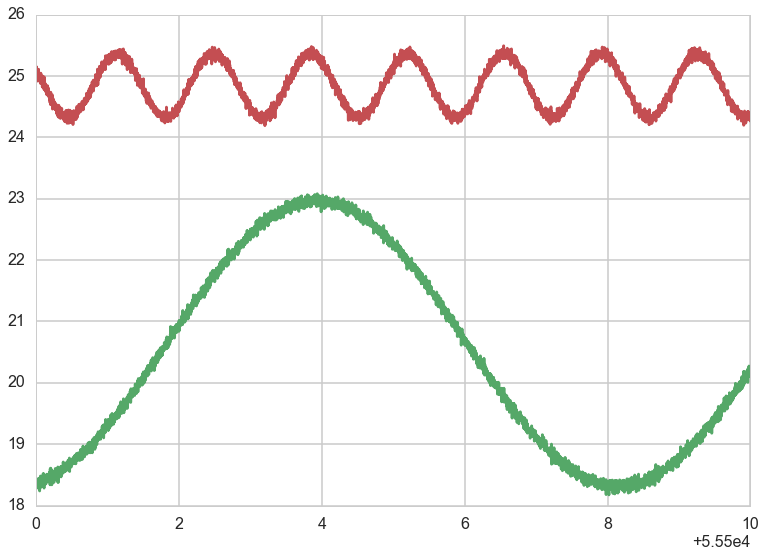

In [13]:
plt.errorbar(mjd[:1000], periodic_mag[0,:1000], yerr=periodic_err[0,:1000], fmt='b.-')
plt.plot(mjd, periodic_mag[18], 'r')
plt.plot(mjd, periodic_mag[24], 'g')
plt.xlim(55500, 55510)
plt.show()

# Sampling Function
### HiTS

In [14]:
n_tot_array = np.arange(20,520,20)
idx_array = []
for nn in n_tot_array:
    print '\r', nn,
    sys.stdout.flush()
    idx_array.append(HiTS_sample_func(mjd, delta=delta_t, n_points=nn, plot=False))

500


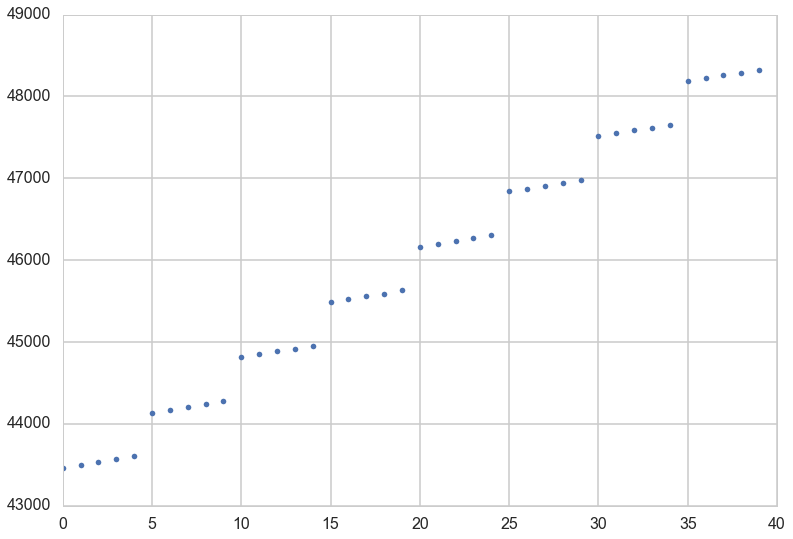

In [15]:
plt.plot(idx_array[1],'.')
plt.show()

In [16]:
feats_N_obs = []
for idx_HiTS in idx_array:
    print '\r','n_obs: %i' % len(idx_HiTS),
    sys.stdout.flush()
    HiTS_LCS_mag = [walk_mag[:,idx_HiTS], normal_mag[:,idx_HiTS], periodic_mag[:,idx_HiTS]]
    HiTS_LCS_err = [walk_err[:,idx_HiTS], normal_err[:,idx_HiTS], periodic_err[:,idx_HiTS]]
    HiTS_LCS_mag = np.concatenate(HiTS_LCS_mag, axis=0)
    HiTS_LCS_err = np.concatenate(HiTS_LCS_err, axis=0)
    HiTS_time = mjd[idx_HiTS]
    
    fats = FATS.FeatureSpace(Data=['magnitude','time','error'], featureList=None, excludeList=[])
    frames_H = []
    for l,(lc_,err_) in enumerate(zip(HiTS_LCS_mag, HiTS_LCS_err)):
        print '\r','\t LC: %i' % l,
        sys.stdout.flush()
        lc = np.array([lc_,HiTS_time,err_])
        feat_HiTS = fats.calculateFeature(lc)
        result = feat_HiTS.result(method = 'dict')
        result_df = pd.DataFrame.from_dict(result, orient = 'index').T
        if 0<=l<100:
            result_df['Class'] = 'RW'
        elif 100<=l<200:
            result_df['Class'] = 'Flat'
        elif 200<=l:
            result_df['Class'] = 'Periodic'
        frames_H.append(result_df)
    
    feat_HiTS = pd.concat(frames_H, axis=0)
    feats_N_obs.append(feat_HiTS)
panel_dict = { nnn : feats_N_obs.ix[nnn] for nnn in map(str, n_tot_array)}
panel = pd.Panel(panel_dict)

n_obs: 20 Warning: the feature Color could not be calculated because ['magnitude', 'time', 'magnitude2'] are needed.
	 LC: 1

/Users/jorgetil/miniconda/lib/python2.7/site-packages/scipy/optimize/_minimize.py:391: RuntimeWarning: Method nelder-mead cannot handle constraints nor bounds.
  RuntimeWarning)


	 LC: 104 CAR lik se fue a inf
	 LC: 139 CAR lik se fue a inf
	 LC: 183 CAR lik se fue a inf
n_obs: 40 Warning: the feature Color could not be calculated because ['magnitude', 'time', 'magnitude2'] are needed.
	 LC: 105 CAR lik se fue a inf
	 LC: 106 CAR lik se fue a inf
	 LC: 123 CAR lik se fue a inf
	 LC: 125 CAR lik se fue a inf
	 LC: 127 CAR lik se fue a inf
	 LC: 165 CAR lik se fue a inf
	 LC: 175 CAR lik se fue a inf
	 LC: 191 CAR lik se fue a inf
n_obs: 60 Warning: the feature Color could not be calculated because ['magnitude', 'time', 'magnitude2'] are needed.
	 LC: 112 CAR lik se fue a inf
	 LC: 116 CAR lik se fue a inf
	 LC: 125 CAR lik se fue a inf
	 LC: 139 CAR lik se fue a inf
	 LC: 147 CAR lik se fue a inf
	 LC: 152 CAR lik se fue a inf
	 LC: 161 CAR lik se fue a inf
	 LC: 163 CAR lik se fue a inf
	 LC: 179 CAR lik se fue a inf
	 LC: 186 CAR lik se fue a inf
	 LC: 196 CAR lik se fue a inf
	 LC: 197 CAR lik se fue a inf
n_obs: 80 Warning: the feature Color could not be cal

In [126]:
panel_dict = { nnn : feats_N_obs.ix[nnn] for nnn in map(str, n_tot_array)}
print panel_dict.keys()
panel = pd.Panel(panel_dict)

['60', '80', '20', '180', '40', '320', '340', '400', '420', '480', '360', '200', '140', '300', '440', '460', '120', '260', '240', '280', '100', '160', '220', '380', '500']


In [18]:
feats_N_obs.head()

Psi_eta  PercentAmplitude  MaxSlope  SmallKurtosis  StetsonK  \
20 0  0.664073          0.001164  0.212883      -0.991002  0.807715   
   0  1.145075          0.001479  0.176673      -0.614636  0.682591   
   0  1.325602          0.001205  0.110265      -0.126204  0.651546   
   0  0.316537          0.002159  0.209809      -1.075590  0.726425   
   0  0.296926          0.001468  0.202255      -1.232253  0.743773   

      Meanvariance       Rcs  FluxPercentileRatioMid65  \
20 0      0.000659  0.435824                  0.818905   
   0      0.000757  0.404603                  0.754124   
   0      0.000507  0.381690                  0.682132   
   0      0.001205  0.441818                  0.935939   
   0      0.000746  0.453928                  0.775244   

      Freq3_harmonics_amplitude_0  Freq3_harmonics_amplitude_1  ...    \
20 0                     0.004154                     0.001867  ...     
   0                     0.018792                     0.002074  ...     
   0                     0.015916                     0.012964  ...     
   0                     0.012136                     0.002501  ...     
   0                     0.007509                     0.004119  ...     

      Freq1_harmonics_rel_phase_3  PairSlopeTrend  CAR_sigma  Autocor_length  \
20 0                    -0.254644        0.033333  -0.009014             3.0   
   0                    -0.538495        0.100000   0.022053             3.0   
   0                    -0.611032       -0.100000  -0.017549             2.0   
   0                     1.689964        0.100000   0.031309             3.0   
   0                     0.955639       -0.033333  -0.022823             5.0   

      MedianAbsDev  SlottedA_length  FluxPercentileRatioMid80  PeriodLS  \
20 0      0.010914          0.25500                  0.875099  1.746161   
   0      0.006953          1.02000                  0.882881  0.067531   
   0      0.005608          1.02000                  0.837537  0.069057   
   0      0.022647          1.02000                  0.994067  4.889250   
   0      0.015197          1.08375                  0.910798  6.111562   

      StetsonK_AC  Class  
20 0     0.827175     RW  
   0     0.792128     RW  
   0     0.822277     RW  
   0     0.906542     RW  
   0     0.929545     RW  

[5 rows x 60 columns]

In [127]:
panel.sort_index(axis=0)
panel.to_pickle('/Users/jorgetil/Astro/HITS/tables/Features_FATS_Syntechic_LC_Sample_Funct.pkl')

Amplitude


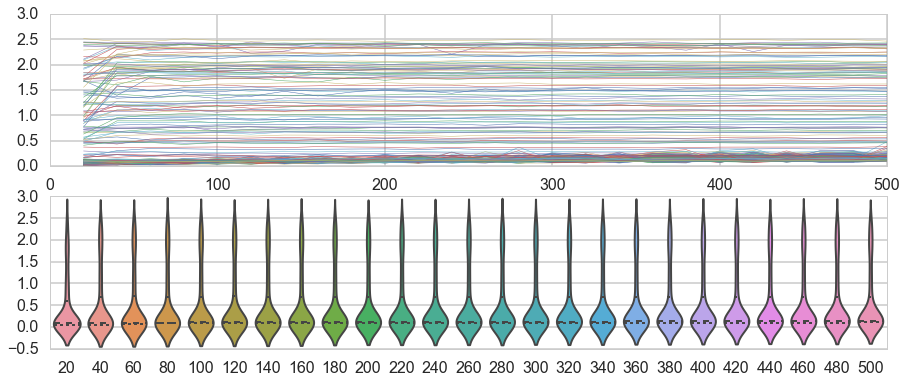

AndersonDarling


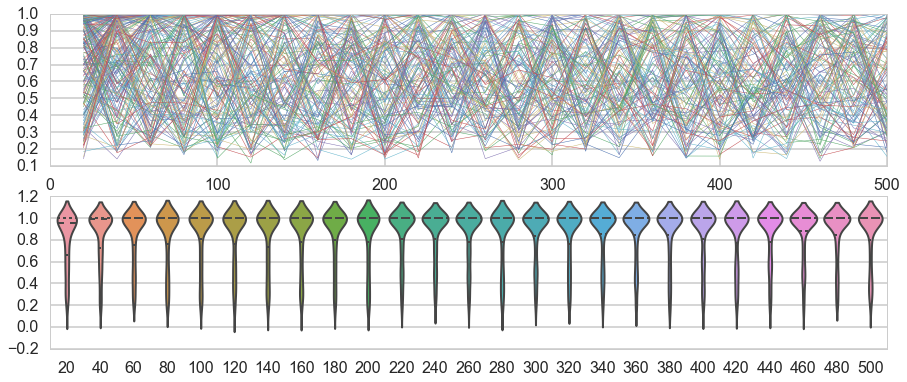

Autocor_length


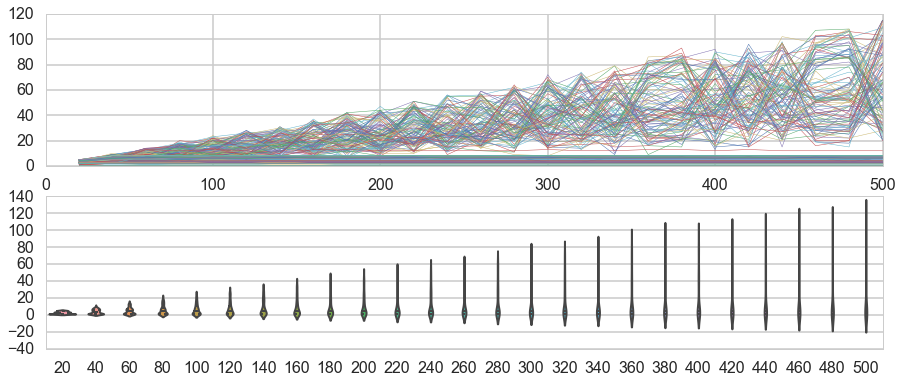

Beyond1Std


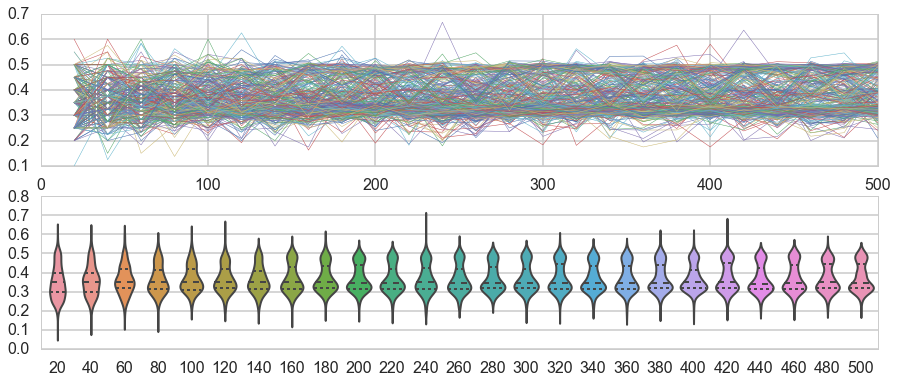

CAR_mean


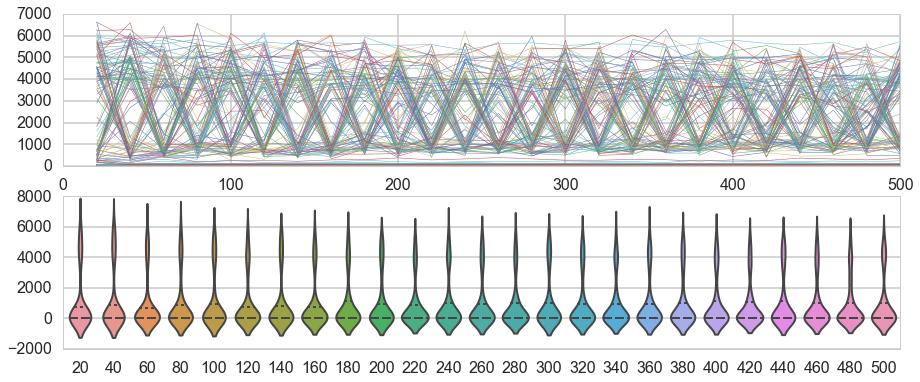

CAR_sigma


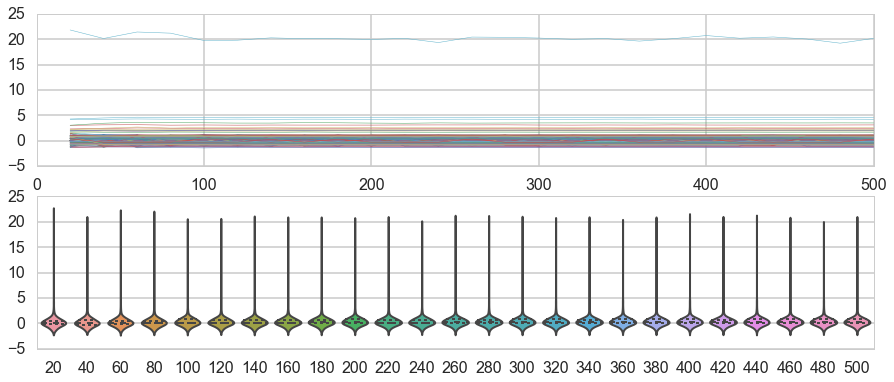

CAR_tau


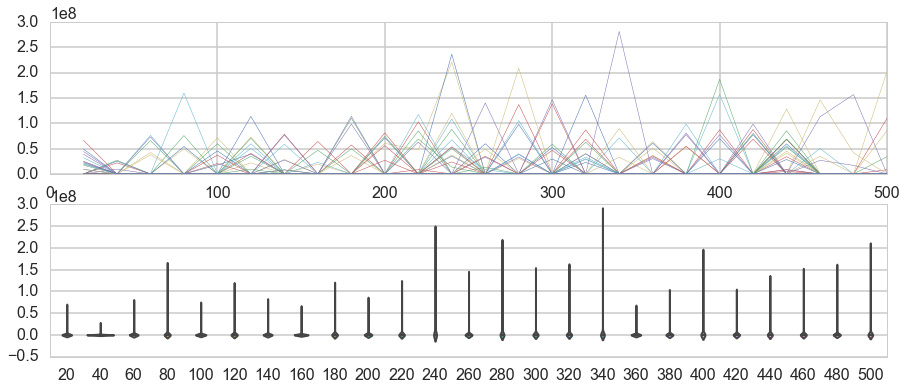

Con


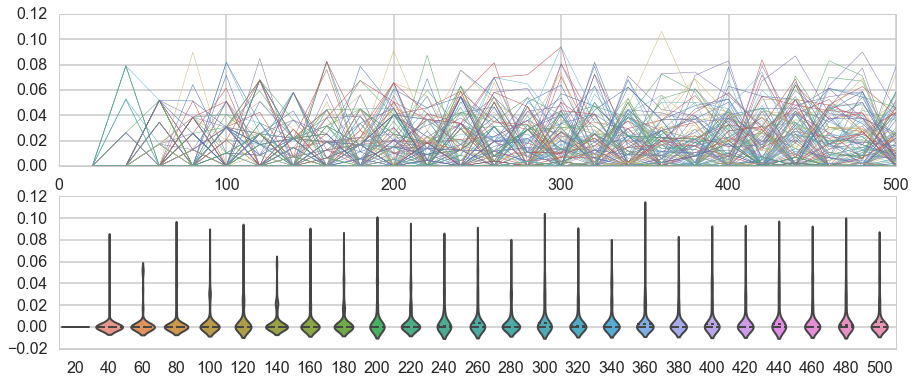

Eta_e


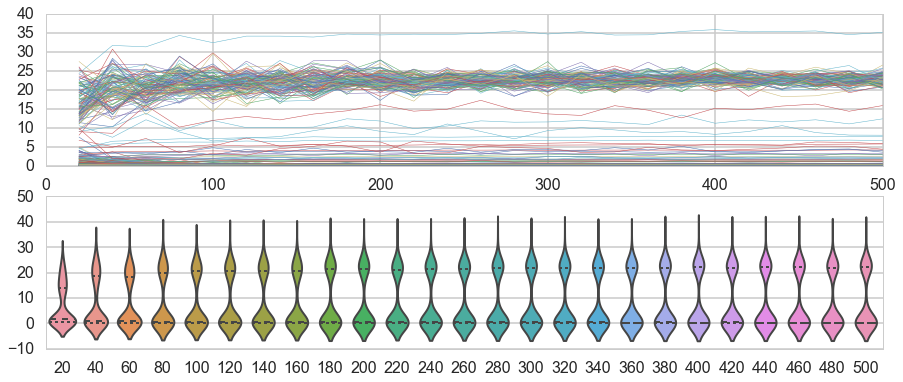

FluxPercentileRatioMid20


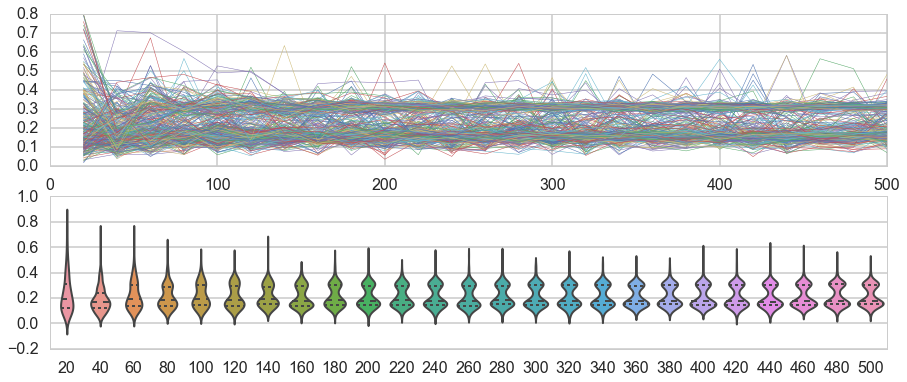

FluxPercentileRatioMid35


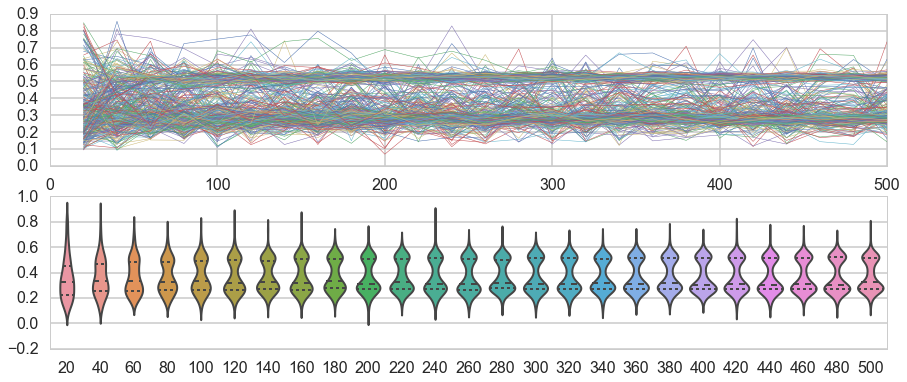

FluxPercentileRatioMid50


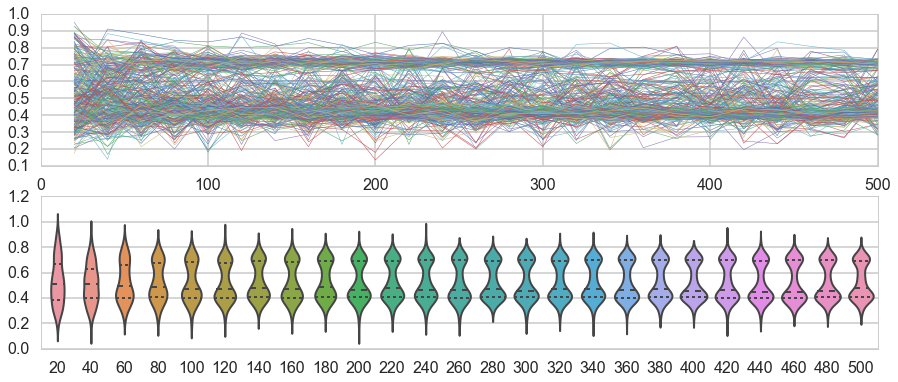

FluxPercentileRatioMid65


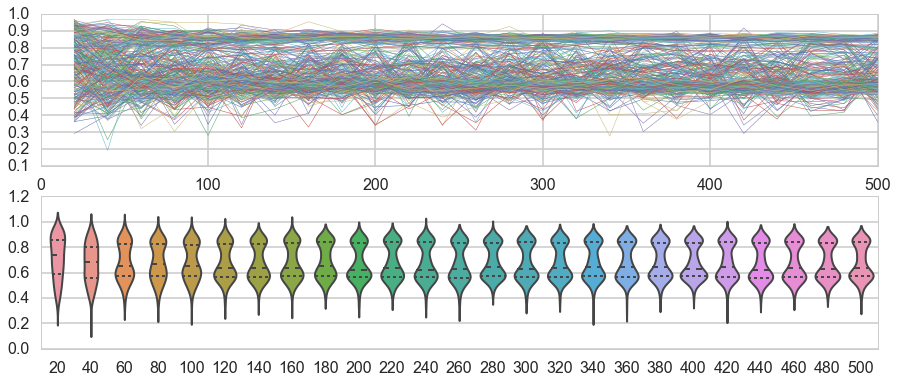

FluxPercentileRatioMid80


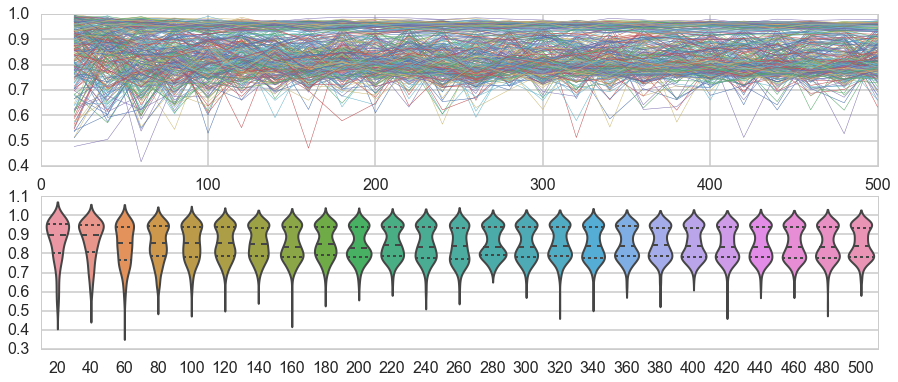

Freq1_harmonics_amplitude_0


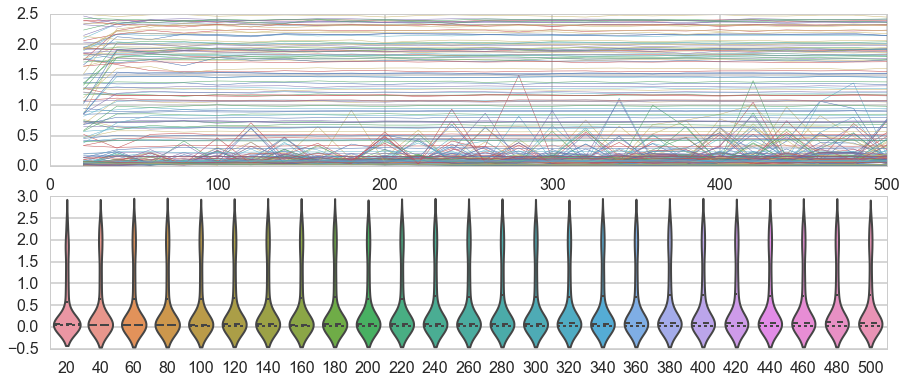

Freq1_harmonics_amplitude_1


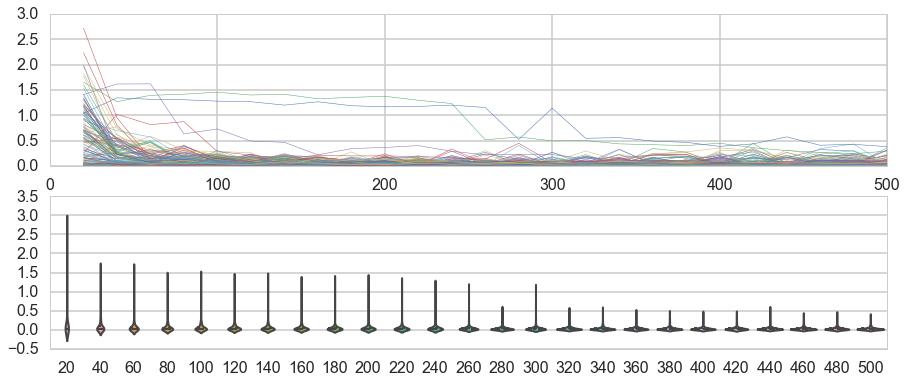

Freq1_harmonics_amplitude_2


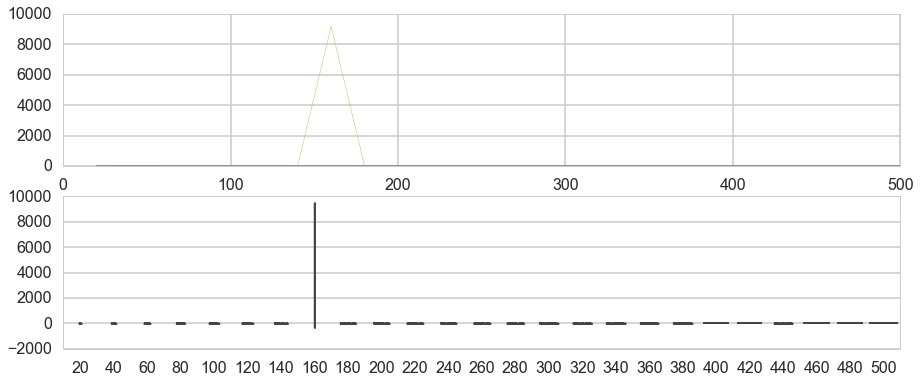

Freq1_harmonics_amplitude_3


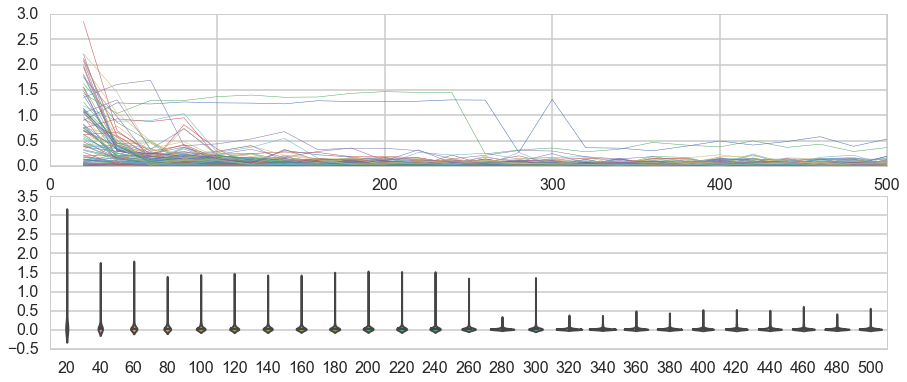

Freq1_harmonics_rel_phase_0


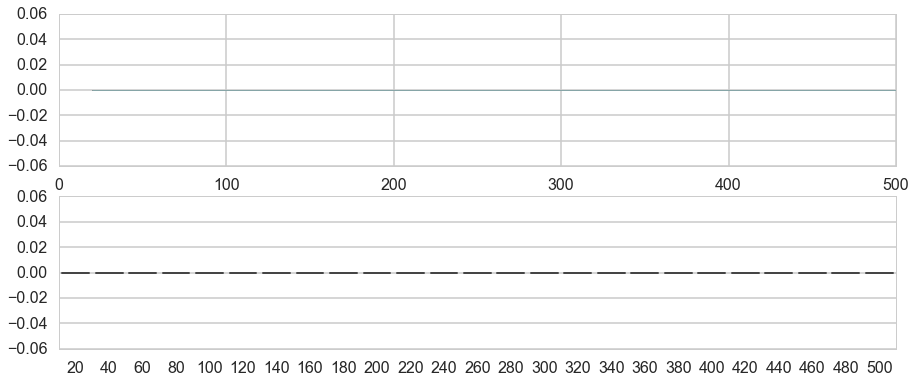

Freq1_harmonics_rel_phase_1


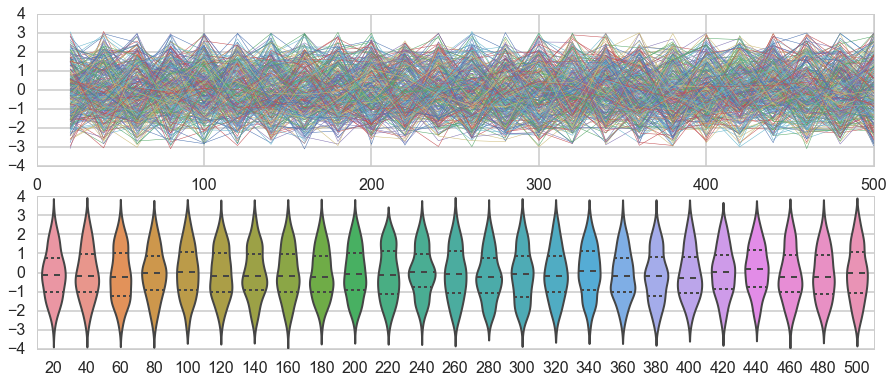

Freq1_harmonics_rel_phase_2


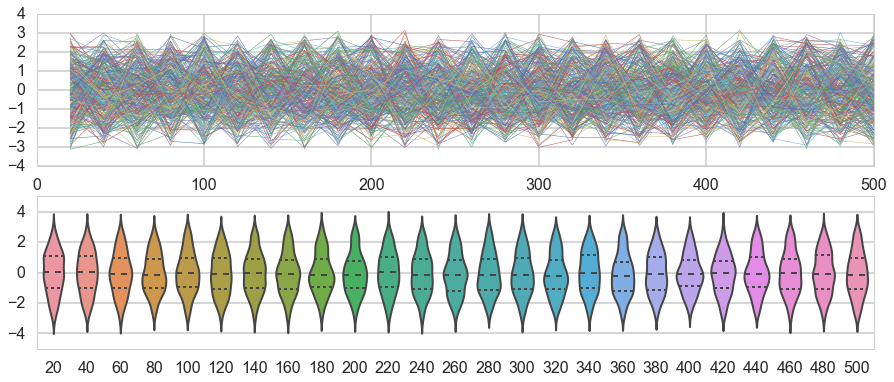

Freq1_harmonics_rel_phase_3


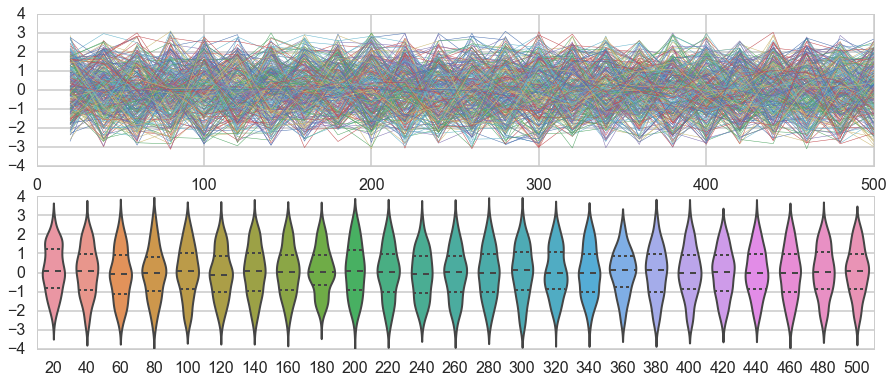

Freq2_harmonics_amplitude_0


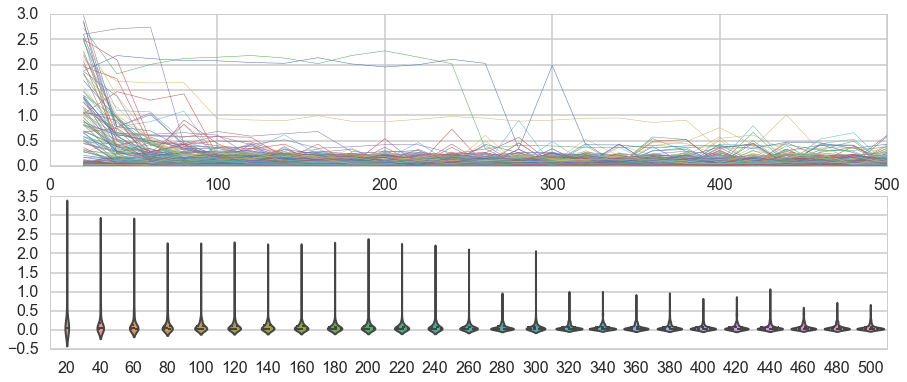

Freq2_harmonics_amplitude_1


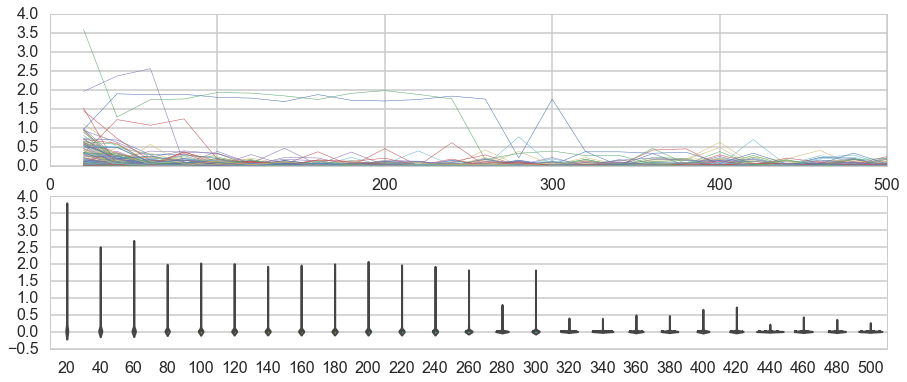

Freq2_harmonics_amplitude_2


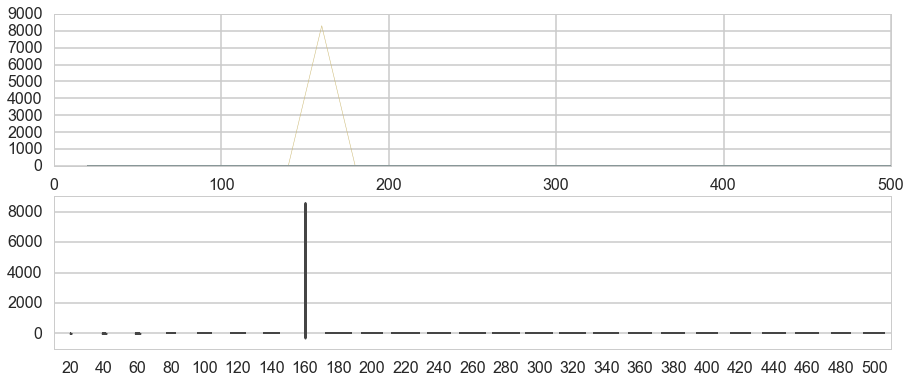

Freq2_harmonics_amplitude_3


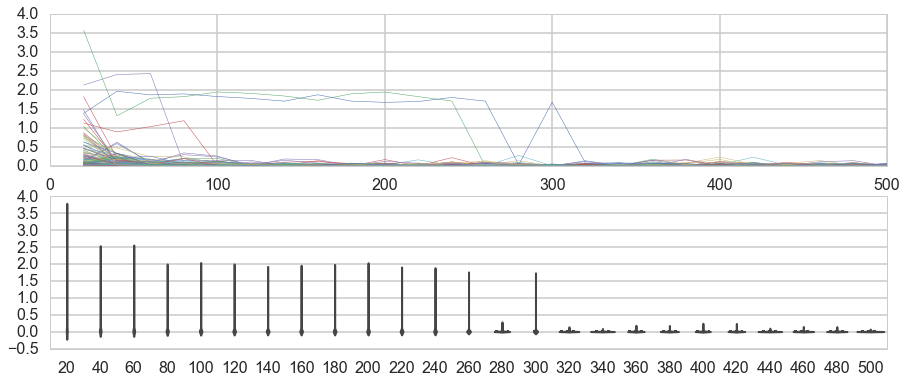

Freq2_harmonics_rel_phase_0


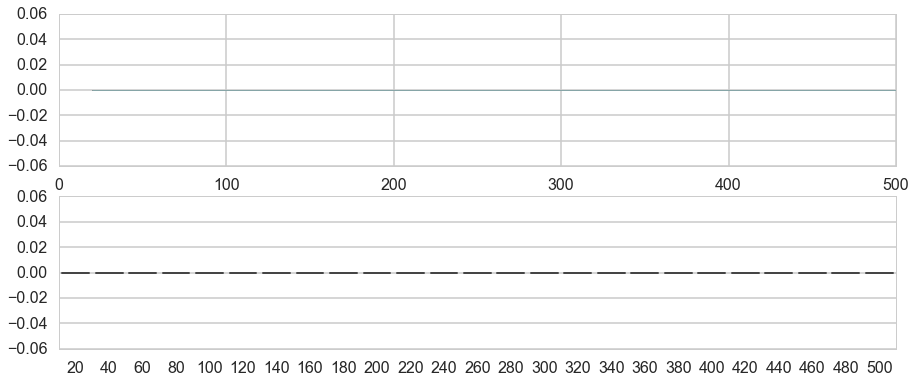

Freq2_harmonics_rel_phase_1


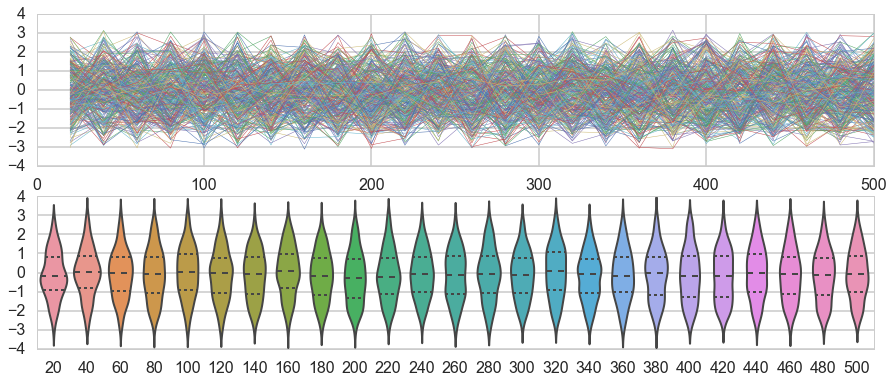

Freq2_harmonics_rel_phase_2


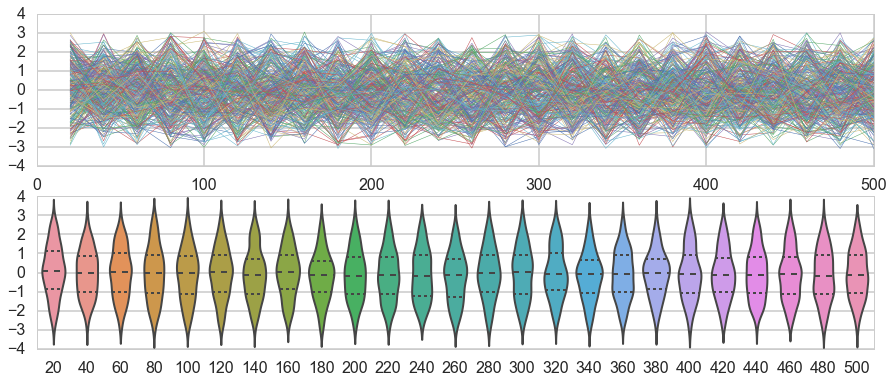

Freq2_harmonics_rel_phase_3


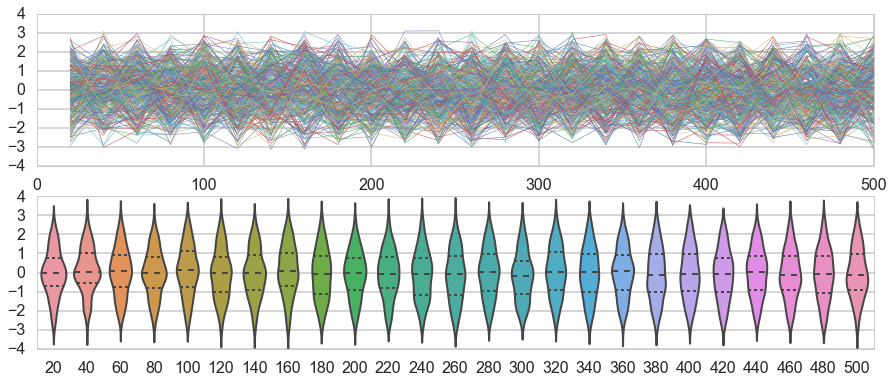

Freq3_harmonics_amplitude_0


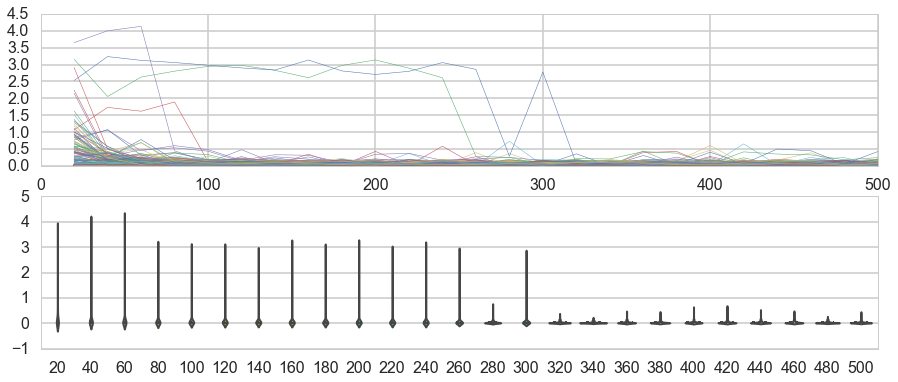

Freq3_harmonics_amplitude_1


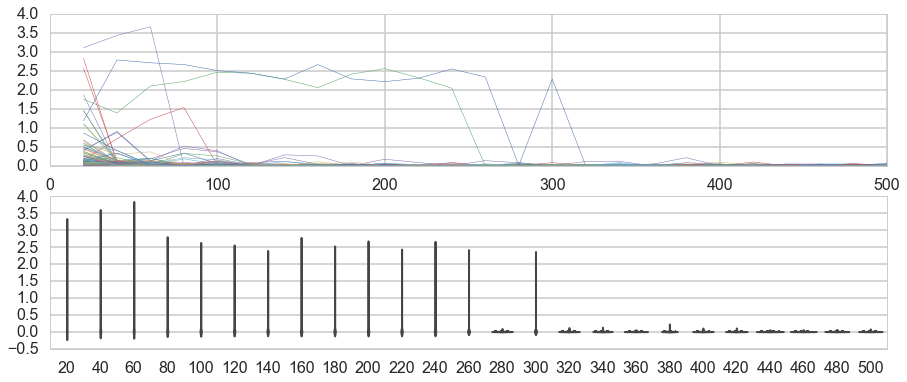

Freq3_harmonics_amplitude_2


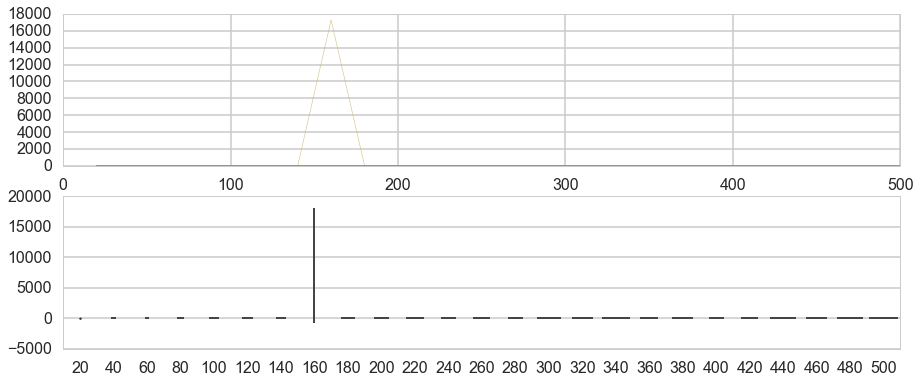

Freq3_harmonics_amplitude_3


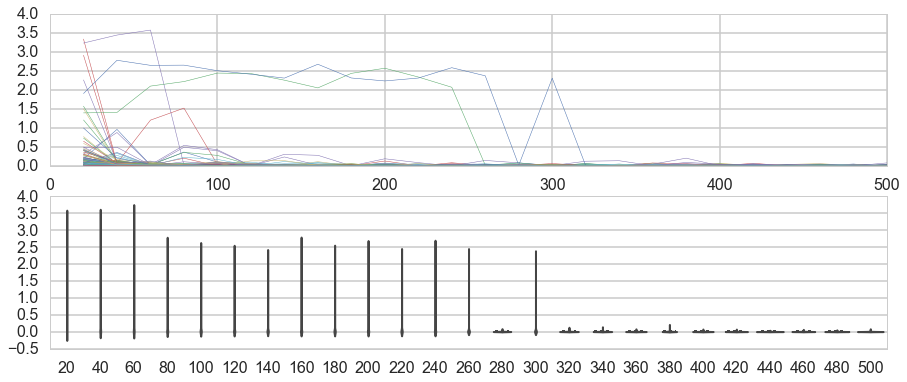

Freq3_harmonics_rel_phase_0


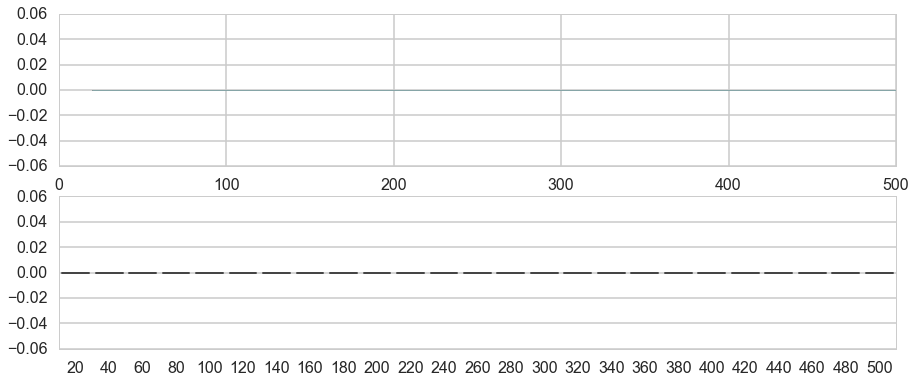

Freq3_harmonics_rel_phase_1


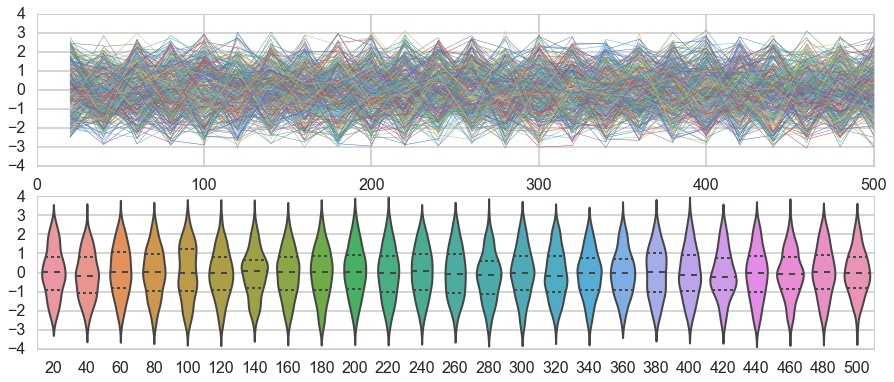

Freq3_harmonics_rel_phase_2


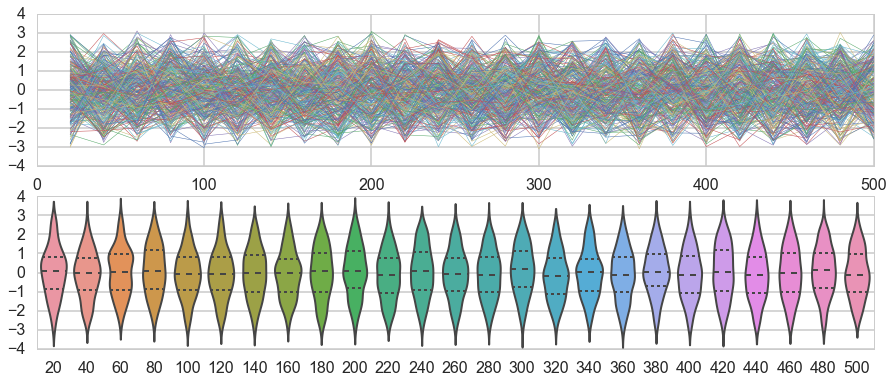

Freq3_harmonics_rel_phase_3


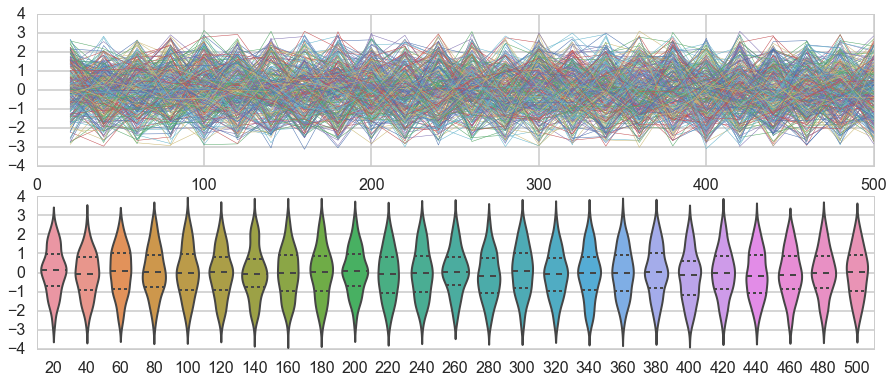

LinearTrend


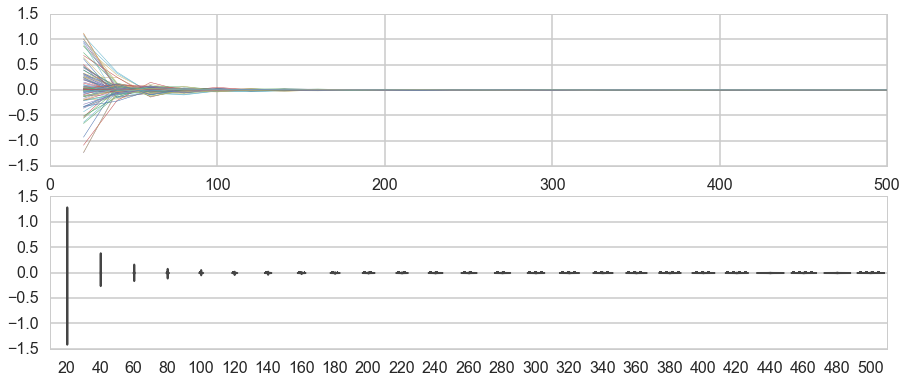

MaxSlope


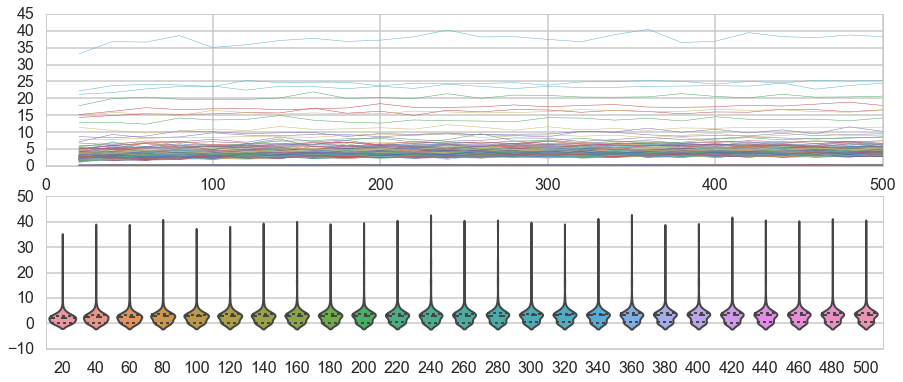

Mean


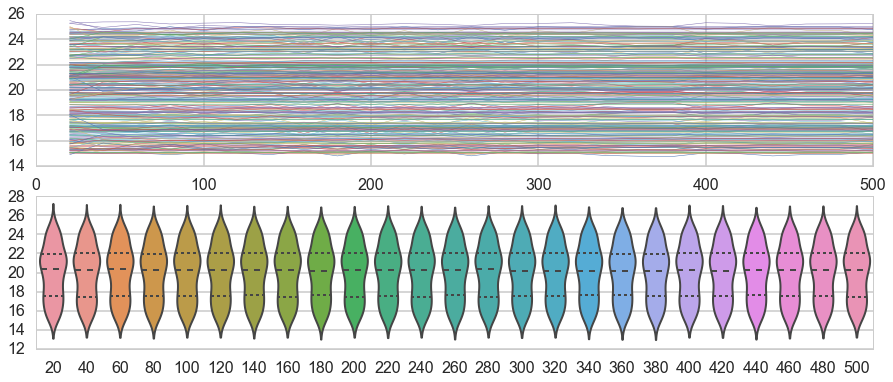

Meanvariance


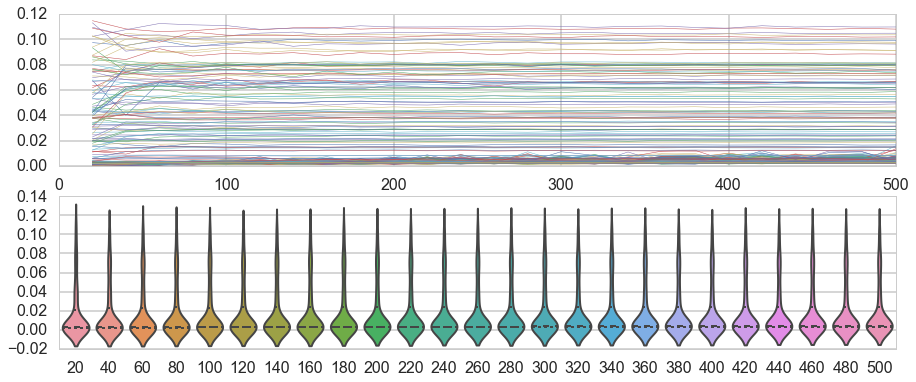

MedianAbsDev


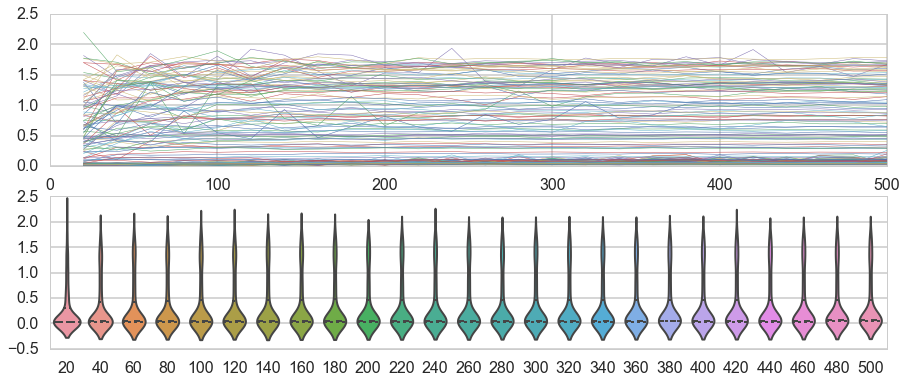

MedianBRP


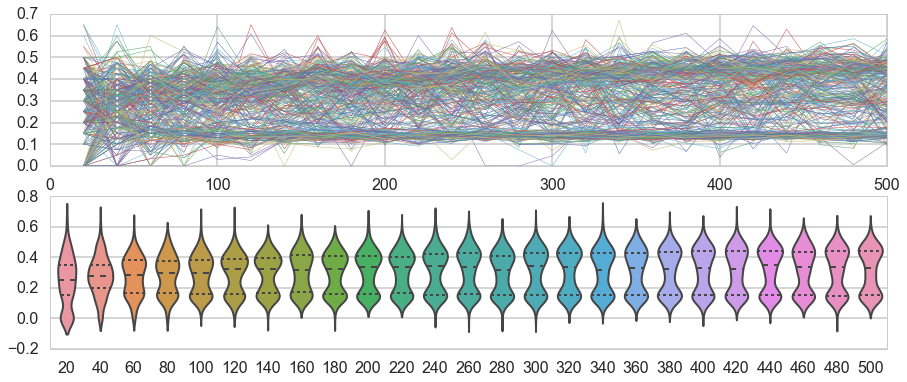

PairSlopeTrend


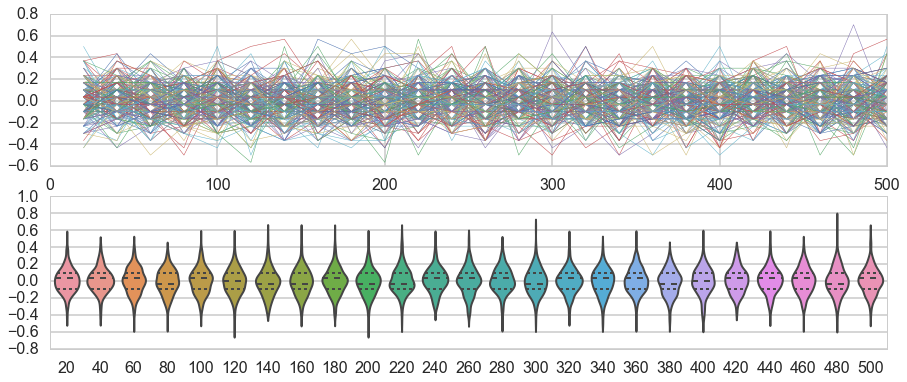

PercentAmplitude


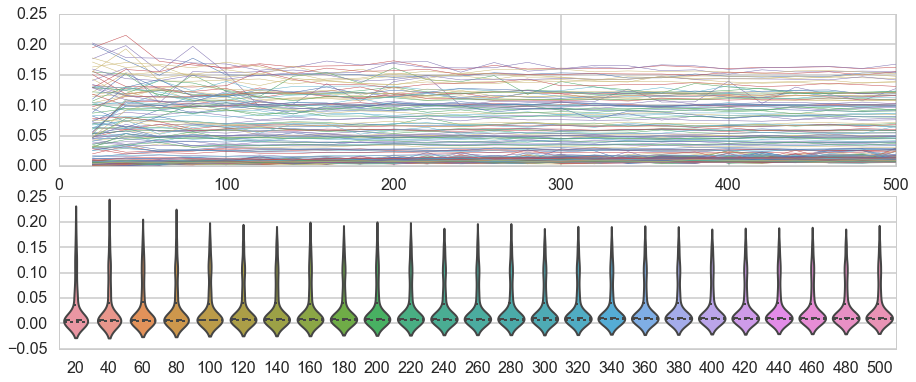

PercentDifferenceFluxPercentile


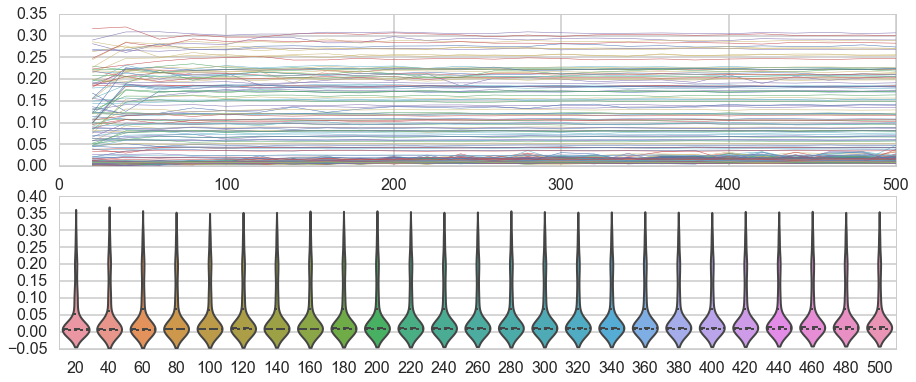

PeriodLS


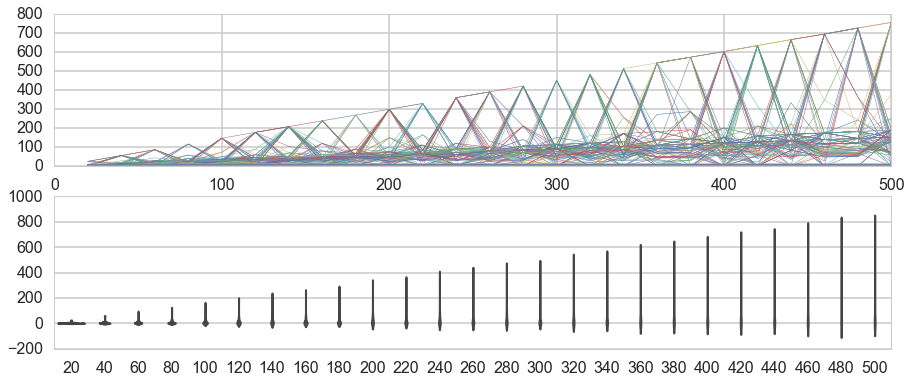

Period_fit


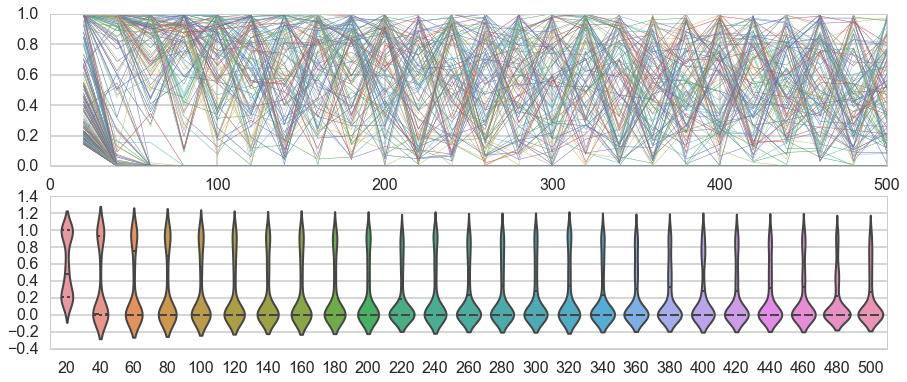

Psi_CS


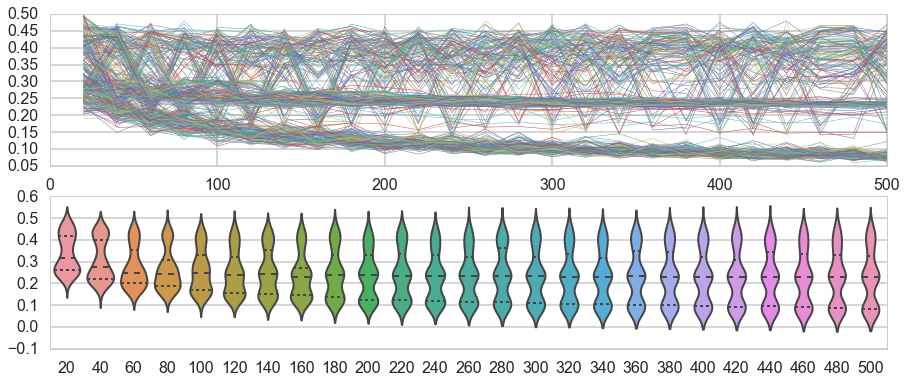

Psi_eta


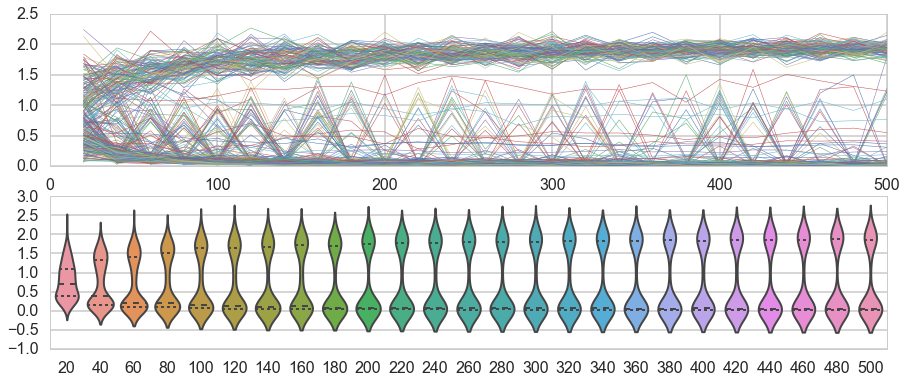

Q31


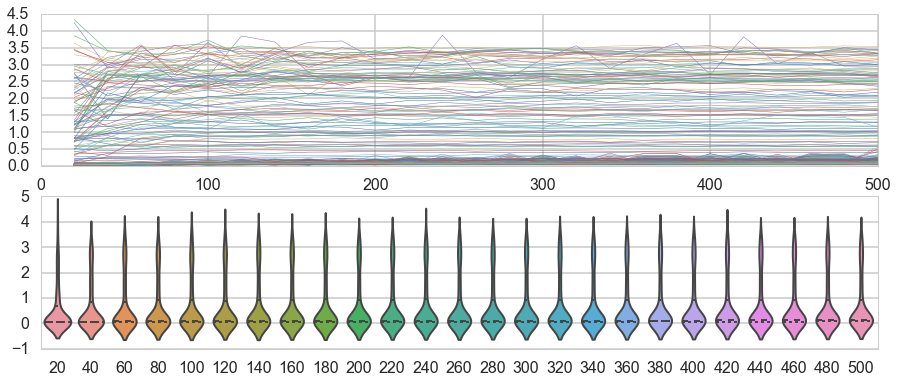

Rcs


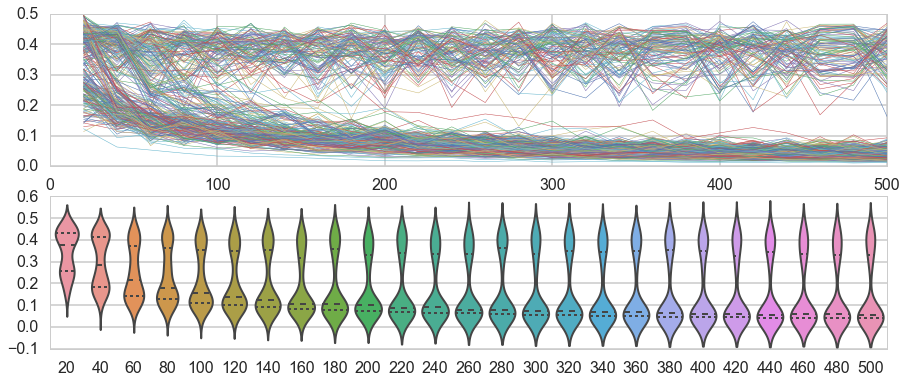

Skew


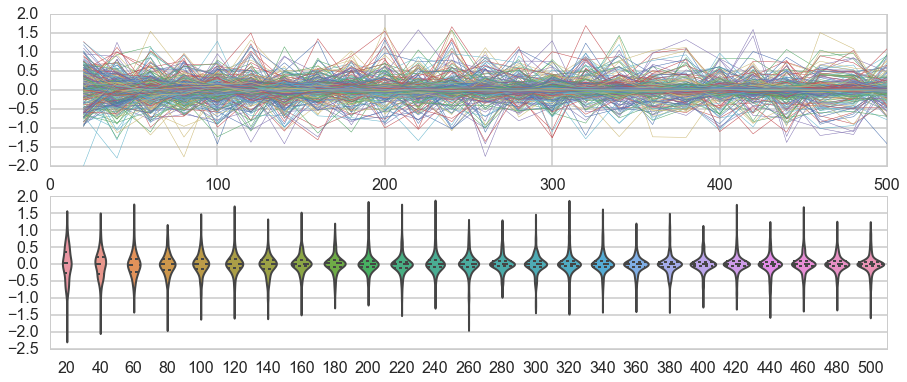

SlottedA_length


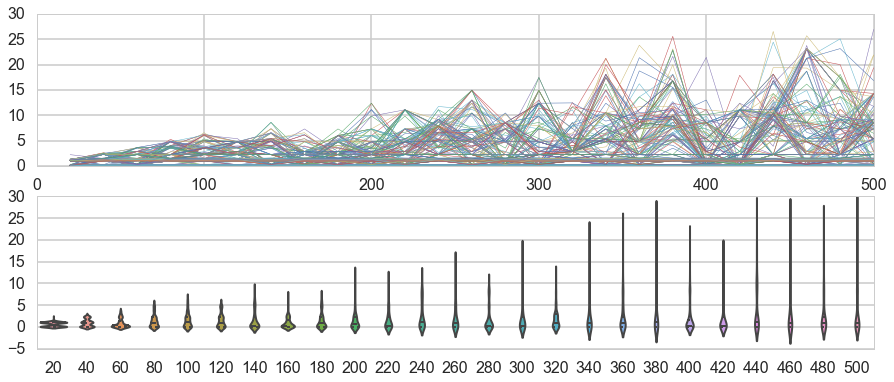

SmallKurtosis


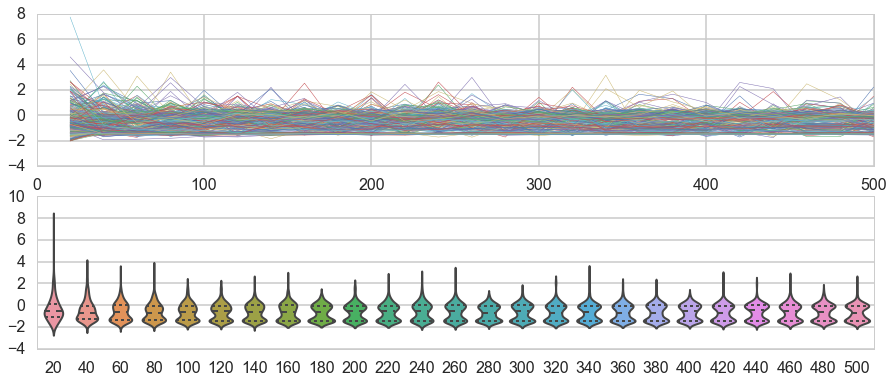

Std


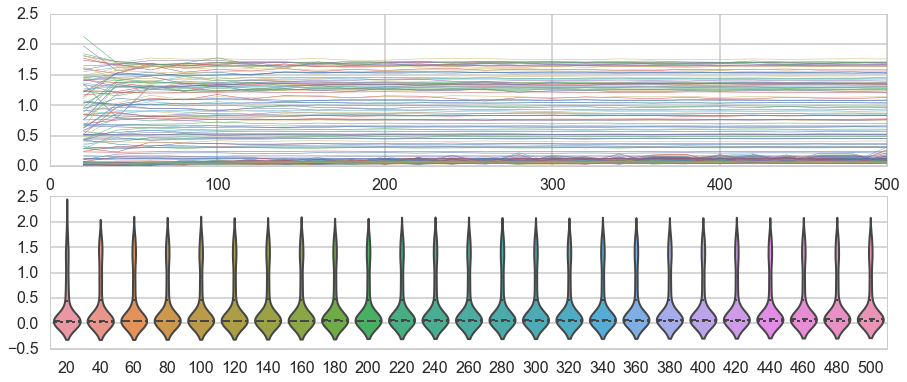

StetsonK


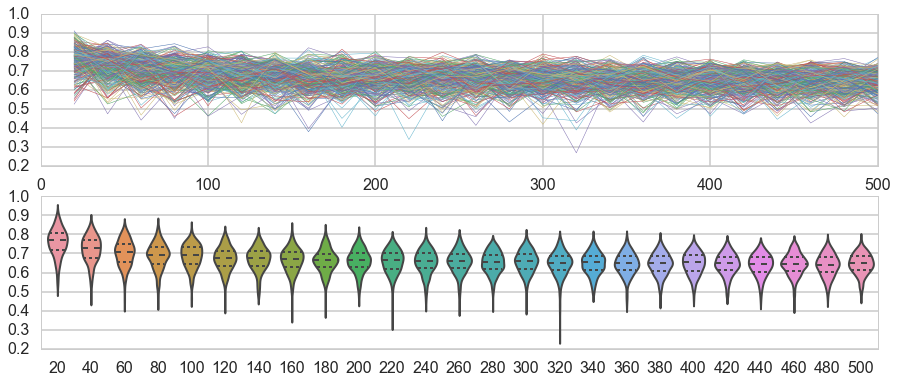

StetsonK_AC


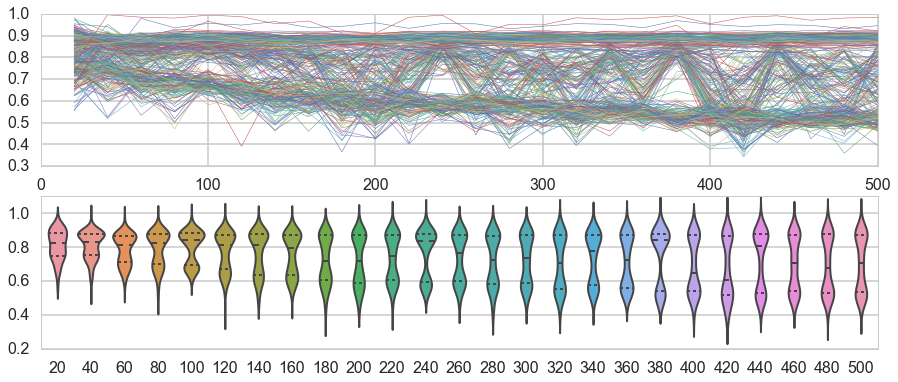

In [139]:
for feat in sorted(panel['20'].columns):
    if feat == 'Class': continue
    print feat
    fig, ax = plt.subplots(nrows=2, figsize = (15,6))
    for ii in range(len(panel.minor_xs('Amplitude'))):
        ax[0].plot(panel.minor_xs(feat).iloc[ii][map(str, n_tot_array)], '-', linewidth=0.5)
    sns.violinplot(data=panel.minor_xs(feat)[map(str, n_tot_array)], inner='quart', linewidth=2, ax=ax[1])
    plt.show()
    #break

# MACHO

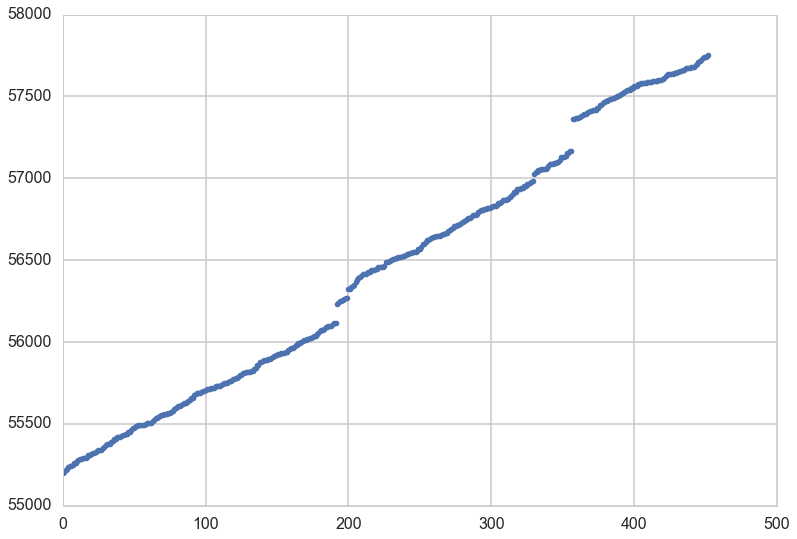

299 460


In [142]:
idx_MACHO = []
for nn in range(300):
    if nn==0:
        idx_MACHO.append(MACHO_sample_func(mjd, delta=delta_t, n_points=500,plot=True))
    else:
        idx_MACHO.append(MACHO_sample_func(mjd, delta=delta_t, n_points=500,plot=False))
    print '\r', nn, len(idx_MACHO[nn]),
    sys.stdout.flush()

In [ ]:
MACHO_LCS_mag = [walk_mag, normal_mag, periodic_mag]
MACHO_LCS_err = [walk_err, normal_err, periodic_err]
MACHO_LCS_mag = np.concatenate(MACHO_LCS_mag, axis=0)
MACHO_LCS_err = np.concatenate(MACHO_LCS_err, axis=0)
print MACHO_LCS_mag.shape
print MACHO_LCS_err.shape

In [ ]:
fats = FATS.FeatureSpace(Data=['magnitude','time','error'], featureList=None, excludeList=[])
frames_M = []
for l,idx_ in enumerate(idx_MACHO):
    print '\r', l, len(idx_),
    sys.stdout.flush()
    lc = np.array([MACHO_LCS_mag[l,idx_],mjd[idx_], MACHO_LCS_err[l,idx_]])
    feat_MACHO = fats.calculateFeature(lc)
    result = feat_MACHO.result(method = 'dict')
    result_df = pd.DataFrame.from_dict(result, orient = 'index').T
    if 0<=l<200:
        result_df['Class'] = 'RW'
    elif 200<=l<400:
        result_df['Class'] = 'Flat'
    elif 400<=l:
        result_df['Class'] = 'Periodic'
    frames_M.append(result_df)

In [ ]:
feat_MACHO = pd.concat(frames_M, axis=0)
feat_MACHO.info()

In [ ]:
for feat in sorted(feat_HiTS.columns):
    if feat=='Class': continue
    print feat
    try:
        AD_t = anderson_ksamp([feat_HiTS[feat].values, feat_MACHO[feat].values])
        print 'Anderson-Darling'
        print 'A2= %f  | p-value = %f' % (AD_t[0], AD_t[2])
    except (OverflowError, ValueError):
        print 'AD test fail'
    fig, ax = plt.subplots(ncols=2, figsize = (15,6))
    ax[0].scatter(feat_MACHO.query('Class=="RW"')[feat],
                  feat_HiTS.query('Class=="RW"')[feat], color='b', marker='o',label='RW')
    ax[0].scatter(feat_MACHO.query('Class=="Flat"')[feat],
                  feat_HiTS.query('Class=="Flat"')[feat], color='r', marker='o',label='Flat')
    ax[0].scatter(feat_MACHO.query('Class=="Periodic"')[feat],
                  feat_HiTS.query('Class=="Periodic"')[feat], color='g', marker='o',label='Periodic')
    ax[0].legend(loc='best')
    #sns.kdeplot(feat_MACHO[feat], shade=True, label='MACHO')
    ax[0].set_xlabel('MACHO')
    ax[0].set_ylabel('HiTS')
    sns.kdeplot(feat_HiTS[feat], shade=True, label='HiTS', ax=ax[1])
    sns.kdeplot(feat_MACHO[feat], shade=True, label='MACHO', ax=ax[1])
    ax[1].set_xlabel(feat)
    plt.show()